<a href="https://colab.research.google.com/github/PuChan-HCI/myweb/blob/main/DeepLearning-with-Pytorch/04_Deep_Learning_for_Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Deep Learning with PyTorch**

<img align="left" style="width:80px;height:98px;padding-right:20px;" src="https://puchan-hci.github.io/myweb/DeepLearning-with-Pytorch/img/03_1.jpg">

# Deep Learning for Computer Vision

We will cover the important building blocks of convolutional
networks. Some of the important topics that we will be covering in this chapter are:
Introduction to neural networks
Building a CNN model from scratch
Creating and exploring a VGG16 model
Calculating pre-convoluted features
Understanding what a CNN model learns
Visualizing weights of the CNN layer
We will explore how we can build an architecture from scratch for solving image
classification problems, which are the most common use cases. We will also learn how to
use transfer learning, which will help us in building image classifiers using a very small
dataset.
<hr>
Here, we use data from https://www.kaggle.com/c/dogs-vs-cats/data which contains 25,000 images of dogs and cats.

## 01. Getting the Data
The data is big (around 500MB). You can upload your data to your Google Drive.

In [ ]:
# # Copy from your google drive and unzip it
# from google.colab import drive
# drive.mount('/content/drive')
# !mkdir -p ./data/
# !cp /content/drive/MyDrive/share/dogsandcats.zip ./data/
# !unzip ./data/dogsandcats.zip -d ./data/

#02. Classifying dogs and cats - CNN from scratch
We will use the  architecture  as listed here:
*  The input dimensions for the first linear layer for our cats and dogs images are 256, 256.
*   We add another linear layer to give more flexibility for the model to learn

In [ ]:
from glob import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import shutil
from torchvision import transforms
from torchvision import models
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import lr_scheduler
from torch import optim
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torch.utils.data import Dataset,DataLoader
import time
%matplotlib inline

The following code will help us in visualizing the images:

In [ ]:

def imshow(inp,cmap=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp,cmap)


### Check if GPU is present

In [ ]:
is_cuda = False
if torch.cuda.is_available():
    is_cuda = True

### Load data into PyTorch tensors

In [ ]:
simple_transform = transforms.Compose([transforms.Resize((224,224))
                                       ,transforms.ToTensor()
                                       ,transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                      ])
train = ImageFolder('data/dogsandcats/train/',simple_transform)
valid = ImageFolder('data/dogsandcats/valid/',simple_transform)

### Confirm the index for each class

In [ ]:
print(train.class_to_idx)
print(train.classes)


{'cat': 0, 'dog': 1}
['cat', 'dog']


### Let see one of the data (cat)

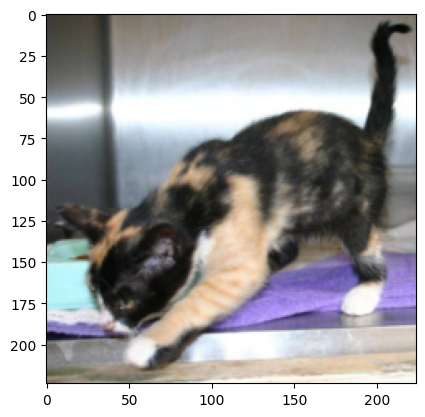

In [ ]:
imshow(valid[770][0])

### Create data generators

In [ ]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=32,num_workers=3,shuffle=True)
valid_data_loader = torch.utils.data.DataLoader(valid,batch_size=32,num_workers=3,shuffle=True)

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(56180, 500)
        self.fc2 = nn.Linear(500,50)
        self.fc3 = nn.Linear(50, 2)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = F.relu(self.fc2(x))
        x = F.dropout(x,training=self.training)
        x = self.fc3(x)
        return F.log_softmax(x,dim=1)

Let's run the model through the preceding function for 20 iterations and plot the loss and accuracy of train and validation, to understand how our network performed. The
following code runs the fit method for the train and validation dataset for 20 iterations:

In [ ]:
model = Net()
if is_cuda:
    model.cuda()

In [ ]:
optimizer = optim.SGD(model.parameters(),lr=0.01,momentum=0.5)

In [ ]:
def fit(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output,target)

        # Use the item() method to extract the scalar value from the tensor
        running_loss += F.nll_loss(output,target,size_average=False).item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()

    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)

    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [ ]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,20):
    epoch_loss, epoch_accuracy = fit(epoch,model,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,model,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is  0.67 and training accuracy is 13391/22994     58.24
validation loss is  0.63 and validation accuracy is 1274/2006     63.51
training loss is  0.63 and training accuracy is 14903/22994     64.81
validation loss is  0.61 and validation accuracy is 1315/2006     65.55
training loss is  0.59 and training accuracy is 15829/22994     68.84
validation loss is  0.54 and validation accuracy is 1469/2006     73.23
training loss is  0.55 and training accuracy is 16685/22994     72.56
validation loss is  0.49 and validation accuracy is 1565/2006     78.02
training loss is  0.51 and training accuracy is 17315/22994      75.3
validation loss is  0.48 and validation accuracy is 1559/2006     77.72
training loss is  0.48 and training accuracy is 17769/22994     77.28
validation loss is  0.46 and validation accuracy is 1583/2006     78.91
training loss is  0.44 and training accuracy is 18335/22994     79.74
validation loss is  0.46 and validation accuracy is 1574/2006     78.46
traini

The following code plots the training and validation loss:

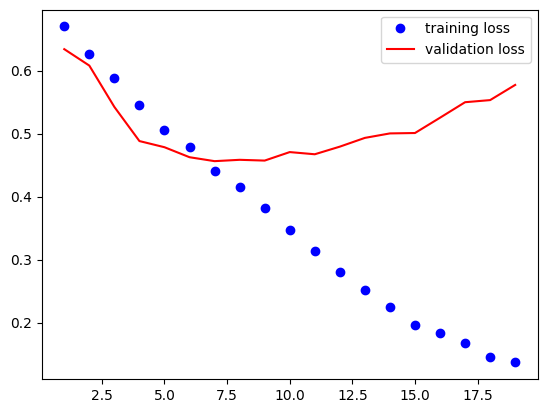

In [ ]:
plt.plot(range(1,len(train_losses)+1),train_losses,'bo',label = 'training loss')
plt.plot(range(1,len(val_losses)+1),val_losses,'r',label = 'validation loss')
plt.legend()

The following code plots the training and validation accuracy:

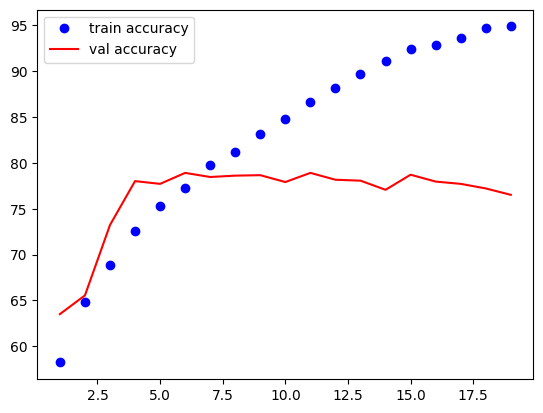

In [ ]:
plt.plot(range(1,len(train_accuracy)+1),train_accuracy,'bo',label = 'train accuracy')
plt.plot(range(1,len(val_accuracy)+1),val_accuracy,'r',label = 'val accuracy')
plt.legend()

*It's clear from the plots that the training loss is decreasing for every iteration, but the
validation loss gets worse. Accuracy also increases during the training, but almost saturates
at 75%. It is a clear example where the model is not generalizing. We will look at another
technique called transfer learning, which helps us in training more accurate models, along
with providing tricks to make the training faster.*

##03. Transfer learning using VGG
Transfer learning is the ability to reuse a trained algorithm on a similar dataset without
training it from scratch. We humans do not learn to recognize new images by analyzing
thousands of similar images. We, as humans, just understand the different features that
actually differentiate a particular animal, say a fox from a dog. We do not need to learn
what a fox is from understanding what lines, eyes, and other smaller features are like. So we
will learn how to use a pre-trained model to build state-of-the-art image classifiers with
very little data.
<hr>
The first few layers of a CNN architecture focus on smaller features, such as how a line or
curve looks. The filters in the later layers of a CNN learn higher-level features, such as eyes
and fingers, and the last few layers learn to identify the exact category. A pre-trained model
is an algorithm that is trained on a similar dataset. Most of the popular algorithms are pretrained
on the popular *ImageNet* dataset to identify 1,000 different categories. Such a pretrained
model will have filter weights tuned to identify various patterns. So, let's
understand how can we take advantage of these pre-trained weights. We will look into an
algorithm called VGG16, which was one of the earliest algorithms to find success in
ImageNet competitions. Though there are more modern algorithms, this algorithm is still
popular as it is simple to understand and use for transfer learning. Let's take a look at the
architecture of the VGG16 model, and then try to understand the architecture and how we
can use it to train our image classifier:

### Creating and exploring a VGG16 model

In [ ]:
vgg = models.vgg16(pretrained=True)
vgg = vgg.cuda()

The size of the weights could be around 500 MB. We can take a quick look at the
VGG16 model by printing it. Understanding how these networks are implemented turns
out to be very useful when we use modern architectures.

In [ ]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Freeze layers
The model summary contains two sequential model features and classifier. The
features sequential model has the layers that we are going to freeze. Let's freeze all the layers of the features model, which contains the convolutional block.
Freezing the weights in the layers will prevent the weights of these convolutional blocks. As
the weights of the model are trained to recognize a lot of important features, our algorithm
would be able to do the same from the very first iteration. The ability to use models
weights, which were initially trained for a different use case, is called *transfer learning*.
Now let's look at how we can freeze the weights, or parameters, of layers:

In [ ]:
vgg.classifier[6].out_features = 2

The VGG16 model is trained to classify 1,000 categories, but not trained to classify dogs and
cats. So, we need to change the output features of the last layer to 2 from 1,000. The
following code snippet does it:

In [ ]:
for param in vgg.features.parameters(): param.requires_grad = False

The *vgg.classifier* gives access to all the layers inside the sequential model, and the
sixth element will contain the last layer. When we train the VGG16 model, we only need the
classifier parameters to be trained. So, we pass only the *classifier.parameters* to the
optimizer as follows:

In [ ]:
optimizer = optim.SGD(vgg.classifier.parameters(),lr=0.0001,momentum=0.5)

### Training the VGG16 model
The following
code snippet will train the model for 20 epochs, reaching a validation accuracy of 98.45%:

In [ ]:
def fit(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output,target)

        # Use the item() method to extract the scalar value from the tensor
        running_loss += F.cross_entropy(output,target,size_average=False).item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()

    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)

    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [ ]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,10):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is   3.2 and training accuracy is 13665/22994     59.43
validation loss is   0.2 and validation accuracy is 1898/2006     94.62
training loss is  0.17 and training accuracy is 21911/22994     95.29
validation loss is 0.089 and validation accuracy is 1947/2006     97.06
training loss is  0.11 and training accuracy is 22224/22994     96.65
validation loss is 0.067 and validation accuracy is 1959/2006     97.66
training loss is 0.089 and training accuracy is 22372/22994     97.29
validation loss is 0.057 and validation accuracy is 1964/2006     97.91
training loss is 0.078 and training accuracy is 22421/22994     97.51
validation loss is 0.051 and validation accuracy is 1966/2006     98.01
training loss is 0.072 and training accuracy is 22451/22994     97.64
validation loss is 0.047 and validation accuracy is 1970/2006     98.21
training loss is  0.07 and training accuracy is 22463/22994     97.69
validation loss is 0.044 and validation accuracy is 1973/2006     98.35
traini

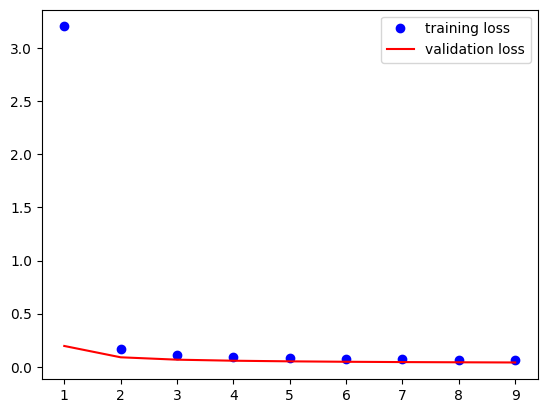

In [ ]:
plt.plot(range(1,len(train_losses)+1),train_losses,'bo',label = 'training loss')
plt.plot(range(1,len(val_losses)+1),val_losses,'r',label = 'validation loss')
plt.legend()

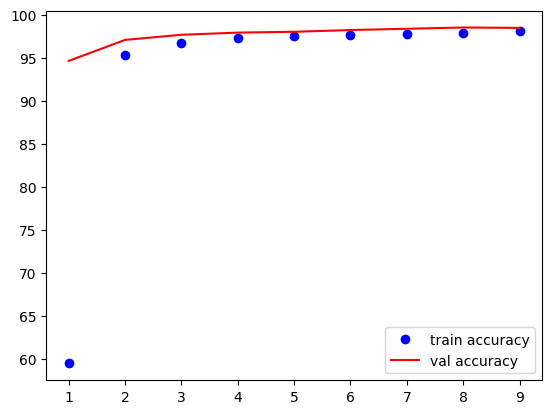

In [ ]:
plt.plot(range(1,len(train_accuracy)+1),train_accuracy,'bo',label = 'train accuracy')
plt.plot(range(1,len(val_accuracy)+1),val_accuracy,'r',label = 'val accuracy')
plt.legend()

### Adjusting dropout
Dropout is one of the most commonly used and the most powerful regularization
techniques used in deep learning. It was developed by Hinton and his students at the
University of Toronto. Dropout is applied to intermediate layers of the model during the
training time.

In [ ]:
for layer in vgg.classifier.children():
    if(type(layer) == nn.Dropout):
        layer.p = 0.2

In [ ]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,3):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is 0.044 and training accuracy is 22646/22994     98.49
validation loss is 0.039 and validation accuracy is 1976/2006      98.5
training loss is 0.044 and training accuracy is 22658/22994     98.54
validation loss is 0.038 and validation accuracy is 1978/2006      98.6


### Data augmentation

In [ ]:
train_transform = transforms.Compose([transforms.Resize((224,224))
                                       ,transforms.RandomHorizontalFlip()
                                       ,transforms.RandomRotation(0.2)
                                       ,transforms.ToTensor()
                                       ,transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                      ])
train = ImageFolder('data/dogsandcats/train/',train_transform)
valid = ImageFolder('data/dogsandcats/valid/',simple_transform)

In [ ]:
train_data_loader = DataLoader(train,batch_size=32,num_workers=3,shuffle=True)
valid_data_loader = DataLoader(valid,batch_size=32,num_workers=3,shuffle=True)

In [ ]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,3):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is 0.045 and training accuracy is 22647/22994     98.49
validation loss is 0.037 and validation accuracy is 1977/2006     98.55
training loss is 0.043 and training accuracy is 22653/22994     98.52
validation loss is 0.037 and validation accuracy is 1977/2006     98.55


## Calculating preconvoluted features
When we freeze the convolution layers and the train model, the input to the fully connected
layers, or dense layers, (*vgg.classifier*) is always the same. To understand better, let's
treat the convolution block, in our example the *vgg.features* block, as a function that has
learned weights and does not change during training. So, calculating the convolution
features and storing them will help us to improve the training speed. The time to train the
model decreases, as we calculate these features only once instead of calculating for each
epoch. Let's visually understand and implement the same:

<img src="https://puchan-hci.github.io/myweb/DeepLearning-with-Pytorch/img/03_2.jpg">

The first box depicts how training is done in general, which could be slow, as we calculate
the convolutional features for every epoch, though the values do not change. In the bottom
box, we calculate the convolutional features once and train only the linear layers. To
calculate the pre-convoluted features, we will pass all the training data through the
convolution blocks and store them. To perform this, we need to select the convolution
blocks of the VGG model. Fortunately, the PyTorch implementation of VGG16 has two
sequential models, so just picking the first sequential model's features is enough. The
following code does that:

In [ ]:
vgg = models.vgg16(pretrained=True)
vgg = vgg.cuda()

In [ ]:
features = vgg.features

In [ ]:
for param in features.parameters(): param.requires_grad = False


In [ ]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=32,num_workers=3,shuffle=False)
valid_data_loader = torch.utils.data.DataLoader(valid,batch_size=32,num_workers=3,shuffle=False)

In [ ]:
def preconvfeat(dataset,model):
    conv_features = []
    labels_list = []
    for data in dataset:
        inputs,labels = data
        if is_cuda:
            inputs , labels = inputs.cuda(),labels.cuda()
        inputs , labels = Variable(inputs),Variable(labels)
        output = model(inputs)
        conv_features.extend(output.data.cpu().numpy())
        labels_list.extend(labels.data.cpu().numpy())
    conv_features = np.concatenate([[feat] for feat in conv_features])

    return (conv_features,labels_list)

In [ ]:
conv_feat_train,labels_train = preconvfeat(train_data_loader,features)

In [ ]:
conv_feat_val,labels_val = preconvfeat(valid_data_loader,features)

The above code, the preconvfeat method takes in the dataset and vgg model and
returns the convoluted features along with the labels associated with it.

Once we have the convolutional features for the train and validation sets, let's create a
PyTorch dataset and DataLoader classes, which will ease up our training process. The
following code creates the Dataset and DataLoader for our convolution features:

In [ ]:
class My_dataset(Dataset):
    def __init__(self,feat,labels):
        self.conv_feat = feat
        self.labels = labels

    def __len__(self):
        return len(self.conv_feat)

    def __getitem__(self,idx):
        return self.conv_feat[idx],self.labels[idx]

In [ ]:
train_feat_dataset = My_dataset(conv_feat_train,labels_train)
val_feat_dataset = My_dataset(conv_feat_val,labels_val)

In [ ]:
train_feat_loader = DataLoader(train_feat_dataset,batch_size=64,shuffle=True)
val_feat_loader = DataLoader(val_feat_dataset,batch_size=64,shuffle=True)

In [ ]:
def data_gen(conv_feat,labels,batch_size=64,shuffle=True):
    labels = np.array(labels)
    if shuffle:
        index = np.random.permutation(len(conv_feat))
        conv_feat = conv_feat[index]
        labels = labels[index]
    for idx in range(0,len(conv_feat),batch_size):
        yield(conv_feat[idx:idx+batch_size],labels[idx:idx+batch_size])

In [ ]:
train_batches = data_gen(conv_feat_train,labels_train)
val_batches = data_gen(conv_feat_val,labels_val)

In [ ]:
optimizer = optim.SGD(vgg.classifier.parameters(),lr=0.0001,momentum=0.5)

In [ ]:
def fit_numpy(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        data = data.view(data.size(0), -1)
        output = model(data)
        loss = F.cross_entropy(output,target)

        #  Use the item() method to extract the scalar value from the tensor
        running_loss += F.cross_entropy(output,target,size_average=False).item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()

    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)

    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [ ]:
%%time
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,20):
    epoch_loss, epoch_accuracy = fit_numpy(epoch,vgg.classifier,train_feat_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit_numpy(epoch,vgg.classifier,val_feat_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is   5.9 and training accuracy is 6892/22994     29.97
validation loss is  0.99 and validation accuracy is 1666/2006     83.05
training loss is  0.48 and training accuracy is 20614/22994     89.65
validation loss is   0.2 and validation accuracy is 1900/2006     94.72
training loss is  0.19 and training accuracy is 21806/22994     94.83
validation loss is  0.12 and validation accuracy is 1934/2006     96.41
training loss is  0.14 and training accuracy is 22099/22994     96.11
validation loss is  0.09 and validation accuracy is 1950/2006     97.21
training loss is  0.12 and training accuracy is 22180/22994     96.46
validation loss is 0.076 and validation accuracy is 1956/2006     97.51
training loss is   0.1 and training accuracy is 22291/22994     96.94
validation loss is 0.067 and validation accuracy is 1959/2006     97.66
training loss is 0.092 and training accuracy is 22346/22994     97.18
validation loss is 0.062 and validation accuracy is 1961/2006     97.76
trainin

## Visualizing intermediate CNN layers
Visualizing the outputs from intermediate layers will help us in understanding how the
input image is being transformed across different layers. Often, the output from each layer
is called an activation. To do this, we should extract output from intermediate layers, which
can be done in different ways. PyTorch provides a method called
*register_forward_hook*, which allows us to pass a function which can extract outputs of
a particular layer.

In [ ]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=32,num_workers=3,shuffle=False)
img,label = next(iter(train_data_loader))

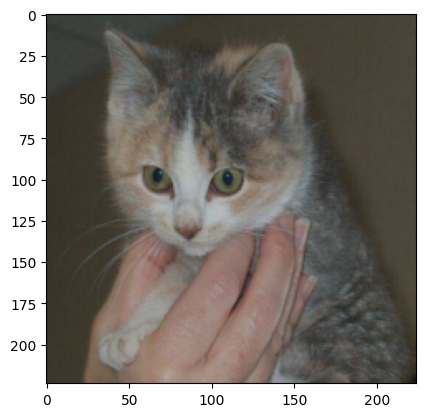

In [ ]:
imshow(img[5])

In [ ]:
img = img[5][None]

By default, PyTorch models only store the output of the last layer, to use memory optimally.
So, before we inspect what the activations from the intermediate layers look like, let's
understand how to extract outputs from the model. Let's look at the following code snippet,
which extracts, and we will walk through it to understand what happens:

In [ ]:
vgg = models.vgg16(pretrained=True).cuda()

In [ ]:
class LayerActivations():
    features=None

    def __init__(self,model,layer_num):
        self.hook = model[layer_num].register_forward_hook(self.hook_fn)

    def hook_fn(self,module,input,output):
        self.features = output.cpu().data.numpy()

    def remove(self):
        self.hook.remove()


conv_out = LayerActivations(vgg.features,0)

o = vgg(Variable(img.cuda()))

conv_out.remove()

In [ ]:
act = conv_out.features

We start with the creation of a pre-trained VGG model, from which we extract the outputs
of a particular layer. The *LayerActivations* class instructs PyTorch to store the output of
a layer to the features variable. Let's walk through each function inside the
*LayerActivations* class.
The init function takes a model and the layer number for which the outputs need to be
extracted as arguments. We call the *register_forward_hook method* on the layer and
pass in a function. PyTorch, when doing a forward pass -- that is, when the images are
passed through the layers -- calls the function that is passed to the
register_forward_hook method* method. This method returns a handle, which can be used to
deregister the function that is passed to the *register_forward_hook method* method.

The *register_forward_hook method* method passes three values to the function that we pass to
it. The *module* parameter allows us access to the layer itself. The second parameter is
*input*, which refers to data that is flowing through the layer. The third parameter is
*output*, which allows access to the transformed inputs, or activation, of the layer. We store
the output to the features variable in the *LayerActivations* class.

The third function takes the *hook* from the *init* function and deregisters the function.
Now we can pass the model and the layer number for which we are looking for activations.
Let's look at the activations created for the following image for different layers:

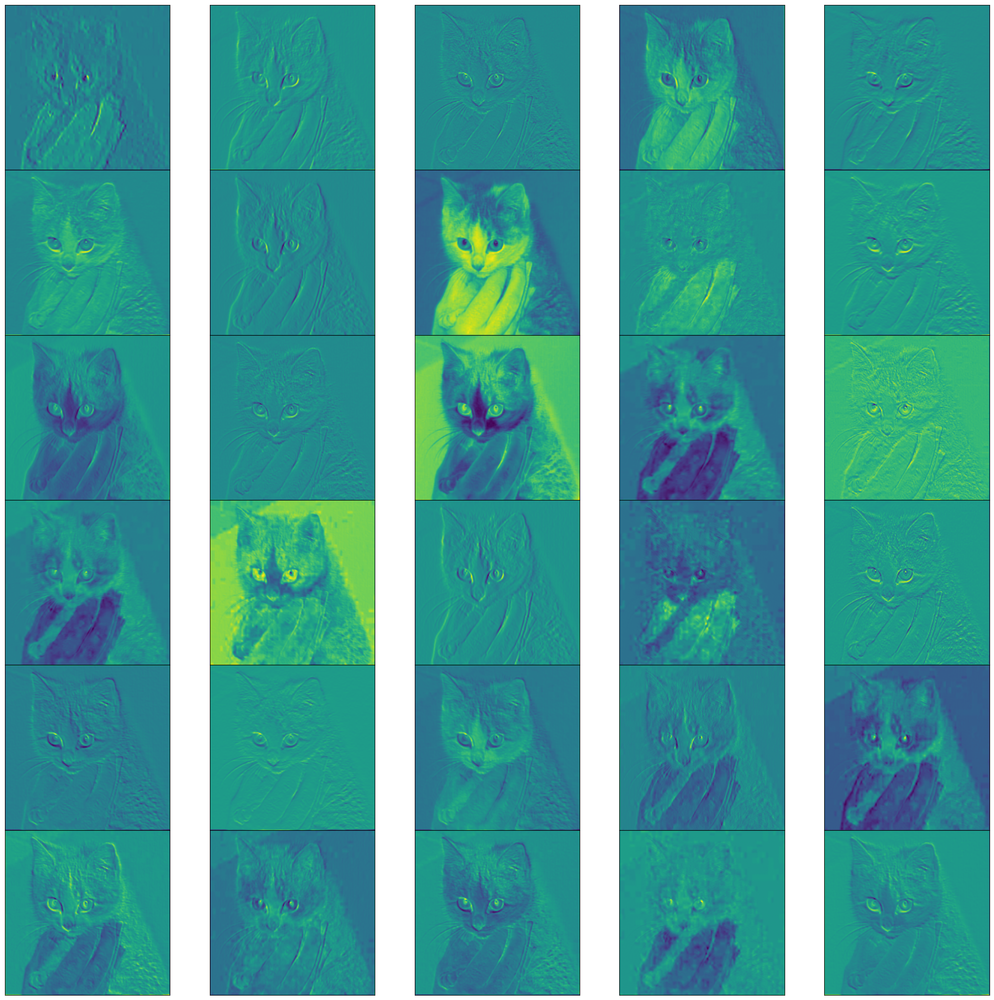

In [ ]:
fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

The above images are some activations created by the first convolution layer.

In [ ]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

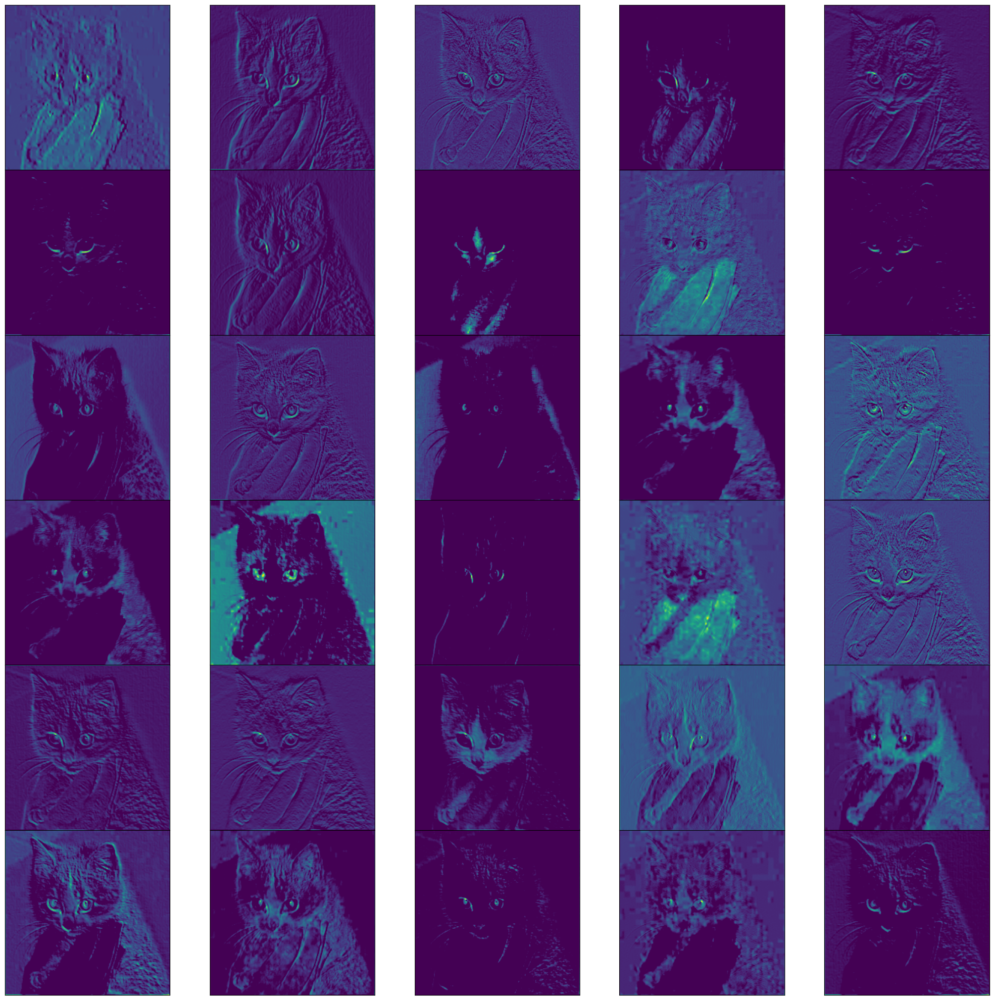

In [ ]:
conv_out = LayerActivations(vgg.features,1)

o = vgg(Variable(img.cuda()))

conv_out.remove()

act = conv_out.features

fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

In [ ]:
def imshow(inp):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)

In [ ]:
conv_out = LayerActivations(vgg.features,5)

o = vgg(Variable(img.cuda()))

conv_out.remove()

act = conv_out.features

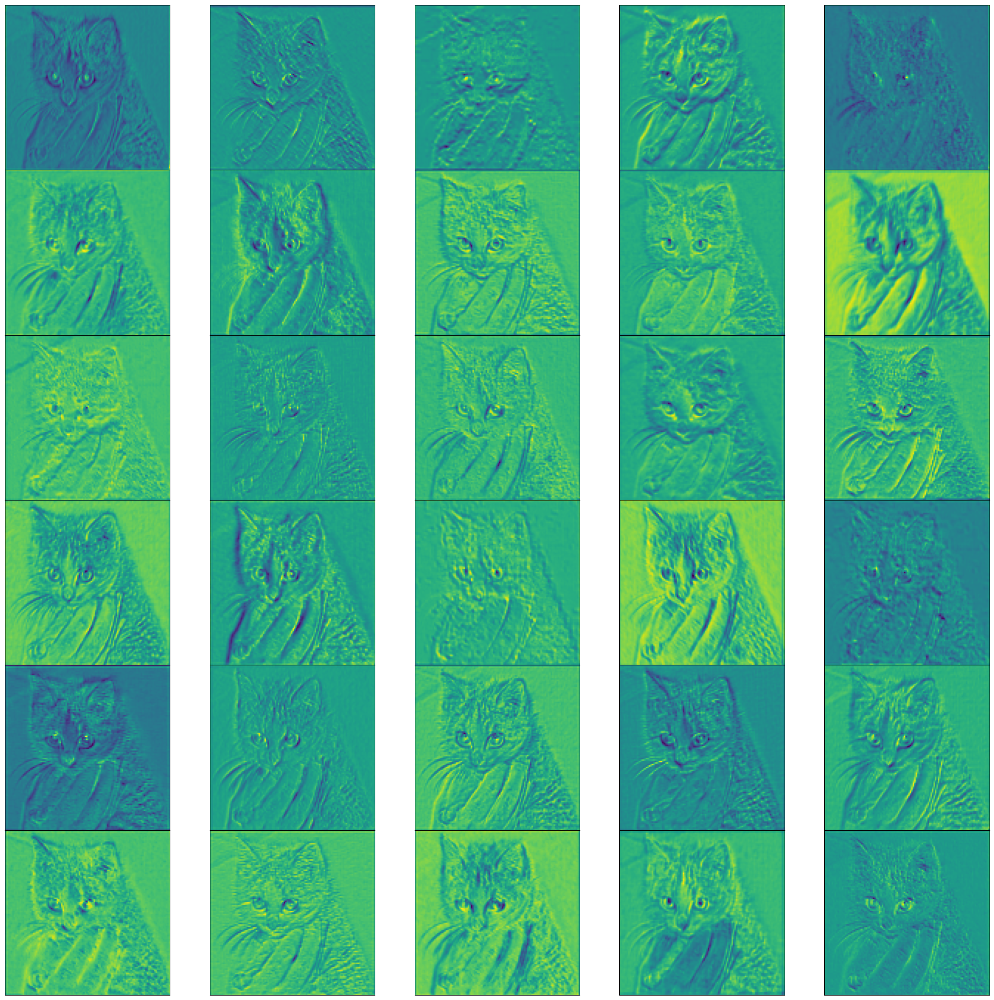

In [ ]:
fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

## Visualizing weights
Getting model weights for a particular layer is straightforward. All the model weights can
be accessed through the *state_dict* function. The *state_dict* function returns a
dictionary, with keys as its layers and weights as its values. The following code
demonstrates how to pull weights for a particular layer and visualize them:

In [ ]:
vgg = models.vgg16(pretrained=True).cuda()

In [ ]:
vgg.state_dict().keys()

odict_keys(['features.0.weight', 'features.0.bias', 'features.2.weight', 'features.2.bias', 'features.5.weight', 'features.5.bias', 'features.7.weight', 'features.7.bias', 'features.10.weight', 'features.10.bias', 'features.12.weight', 'features.12.bias', 'features.14.weight', 'features.14.bias', 'features.17.weight', 'features.17.bias', 'features.19.weight', 'features.19.bias', 'features.21.weight', 'features.21.bias', 'features.24.weight', 'features.24.bias', 'features.26.weight', 'features.26.bias', 'features.28.weight', 'features.28.bias', 'classifier.0.weight', 'classifier.0.bias', 'classifier.3.weight', 'classifier.3.bias', 'classifier.6.weight', 'classifier.6.bias'])

In [ ]:

cnn_weights = vgg.state_dict()['features.0.weight'].cpu()

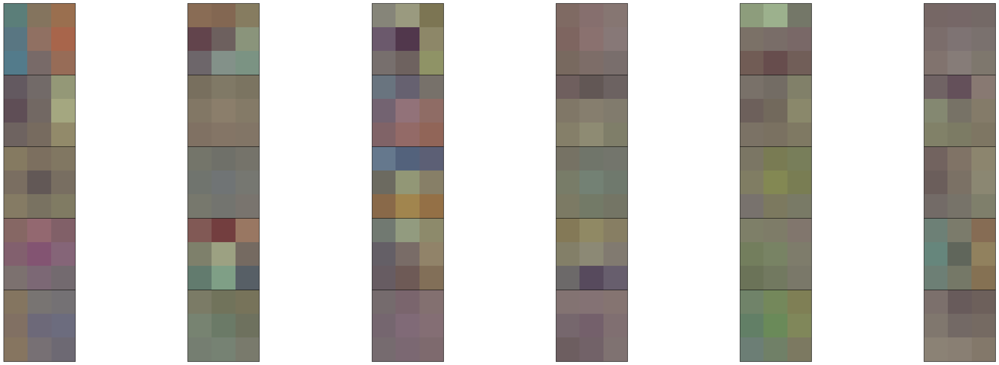

In [ ]:
fig = plt.figure(figsize=(30,30))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,6,i+1,xticks=[],yticks=[])
    imshow(cnn_weights[i])

Each box represents weights of a filter that is of size 3 x 3. Each filter is trained to identify
certain patterns in the images.

In [ ]:
cnn_weights.shape

torch.Size([64, 3, 3, 3])

## Summary
We have learned how to build an image classifier using convents, and also how to
use a pre-trained model. We covered tricks on how to speed up the process of training by
using these pre-convoluted features. Also, we understood different techniques that can be
used to understand what goes on inside a CNN.